In [1]:
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import scanpy as sc
import anndata
import os
import sys

In [24]:
import seaborn as sns
import sklearn as sk
import random as rd

In [3]:
sys.path.insert(1, '/secure/projects/tacco/')
import tacco as tc

In [4]:
sys.path.insert(1, '/secure/projects/HTAPP_MBC/src/spatial')
from spatial_utils import *

In [5]:
combined_dir=out_dir_base+"/combined_all/"
os.makedirs(combined_dir, exist_ok=True)

In [7]:
sample_sheet=pd.read_csv(codeDir+"/meta/sampletracking_HTAPP_MBC_spatial.csv")

In [8]:
#sc sample annotation
sc_samples=pd.read_excel(codeDir+"/meta/clinical features2.xlsx")
sc_samples['sample']=sc_samples['htapp_id']+'-'+sc_samples['htapp_caseid']

In [9]:
sc_samples.head()

,ccpm_id,ccpm_id_long,sample,htapp,htapp_id,htapp_caseid,method,site_biopsy,receptors_biopsy,metastatic_presentation,biopsy_days_after_metastasis,histology_breast,known hereditary predisposition,treatment_status,treatment_current_class,treatment_most_recent_class
0,260,300260,HTAPP-225-SMP-6756,HTAPP,HTAPP-225,SMP-6756,snRNAseq,Breast,ER+/PR+/HER2-,De novo,846,Invasive lobular carcinoma,NaN,on-treatment,Endocrine,Endocrine
1,289,300289,HTAPP-983-SMP-7659,HTAPP,HTAPP-983,SMP-7659,scRNAseq,Liver,ER+/PR+/HER2+,De novo,1466,Invasive ductal carcinoma with mucinous features,ATM,between treatments,off-treatment,Chemotherapy
2,294,300294,HTAPP-589-SMP-2860,HTAPP,HTAPP-589,SMP-2860,snRNAseq,Liver,ER+/PR-/HER2-,Recurrent,823,Invasive ductal carcinoma,NaN,on-treatment,Endocrine + HER2-targeted,Endocrine + HER2-targeted
3,294,300294,HTAPP-589-SMP-2851,HTAPP,HTAPP-589,SMP-2851,snRNAseq,Brain,ER+/PR-/HER2+,Recurrent,900,Invasive ductal carcinoma,NaN,on-treatment,Endocrine,Endocrine
4,360,300360,HTAPP-231-SMP-6758,HTAPP,HTAPP-231,SMP-6758,snRNAseq,Liver,ER+/PR-/HER2-,Recurrent,675,Invasive ductal carcinoma,NaN,between treatments,off-treatment,Immunotherapy


In [10]:
#These identifiers are set as defaults in many functions. If names are changed, this has to be adapted when calling the functions.
ct_column='cell_type'
sm_methods=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"] #spatial mathod names are hard-coded for now because some methods need special treatments. Can be fixed by giving eatch method it's own variable.
sc_method="scRNAseq"
all_methods=[sc_method,*sm_methods]
all_methods

['scRNAseq',
 'slide_seq',
 'merfish',
 'merfish_bin',
 'codex',
 'exseq',
 'exseq_bin']

In [11]:
run_samples=list(filter(lambda a: not a in [''], list(sample_sheet['sample'].unique()))) 
run_samples

['HTAPP-944-SMP-7479',
 'HTAPP-895-SMP-7359',
 'HTAPP-880-SMP-7179',
 'HTAPP-878-SMP-7149',
 'HTAPP-812-SMP-8239',
 'HTAPP-514-SMP-6760',
 'HTAPP-982-SMP-7629',
 'HTAPP-997-SMP-7789',
 'HTAPP-917-SMP-4531',
 'HTAPP-853-SMP-4381',
 'HTAPP-313-SMP-932',
 'HTAPP-330-SMP-1082',
 'HTAPP-783-SMP-4081',
 'HTAPP-364-SMP-1321',
 'HTAPP-213-SMP-6752']

In [12]:
sc_samples=sc_samples.loc[sc_samples['sample'].isin(run_samples)][['sample','method','receptors_biopsy','site_biopsy']].set_index('sample')

In [13]:
sc_samples

,method,receptors_biopsy,site_biopsy
sample,,,
HTAPP-944-SMP-7479,snRNAseq,ER+/PR-/HER2-,Liver
HTAPP-514-SMP-6760,snRNAseq,ER-/PR-/HER2-,Axilla
HTAPP-895-SMP-7359,snRNAseq,ER+/PR+/HER2-,Liver
HTAPP-982-SMP-7629,scRNAseq,ER+/PR+/HER2-,Liver
HTAPP-213-SMP-6752,snRNAseq,ER-/PR-/HER2-,Chest wall
HTAPP-878-SMP-7149,snRNAseq,ER+/PR-/HER2-,Axilla
HTAPP-880-SMP-7179,snRNAseq,ER+/PR+/HER2-,Liver
HTAPP-364-SMP-1321,scRNAseq,ER+/PR-/HER2+,Liver
HTAPP-783-SMP-4081,scRNAseq,ER+/PR-/HER2-,Breast


In [14]:
adatas_combined=pd.Series([[] for i in range(len(all_methods))],index=all_methods,dtype=object) 
#add combined scRNAseq that was produced in the MERFISH analysis 
adatas_combined['scRNAseq']=sc.read_h5ad(out_dir_base+"/combined_merfish/scRNAseq.h5ad")
for method in sm_methods:
    adatas_combined[method]=sc.read(combined_dir+"/"+method+".h5ad",compression="gzip")

In [15]:
adatas_combined

scRNAseq       [[[View of AnnData object with n_obs × n_vars ...
slide_seq      [[[View of AnnData object with n_obs × n_vars ...
merfish        [[[View of AnnData object with n_obs × n_vars ...
merfish_bin    [[[View of AnnData object with n_obs × n_vars ...
codex          [[[View of AnnData object with n_obs × n_vars ...
exseq          [[[View of AnnData object with n_obs × n_vars ...
exseq_bin      [[[View of AnnData object with n_obs × n_vars ...
dtype: object

In [16]:
for method in sm_methods:
    adatas_combined[method].obsm['OT'].fillna(0,inplace=True)
    adatas_combined[method].obsm['RCTD'].fillna(0,inplace=True)
    adatas_combined[method].obsm['OT_max'].fillna(0,inplace=True)

for method in all_methods:    
    for col in sc_samples.columns:
        adatas_combined[method].obs[col]=adatas_combined[method].obs['sample'].map(sc_samples[col])

In [104]:
for method in sm_methods:
    adatas_combined[method].obs.rename(columns={'OT':'cell_type'},inplace=True)

In [17]:
matplotlib.rcParams['figure.dpi'] = low_dpi

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


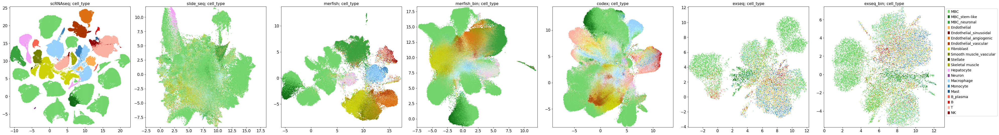

In [105]:
sel_colors=colors[colors.index.isin(adatas_combined[sc_method].obs[ct_column])]
fig = tc.pl.scatter(adatas_combined, keys='cell_type',colors=sel_colors,joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
figheight = fig.get_size_inches()[1]
#fig.savefig(combined_dir+'/all_UMAP_OT.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


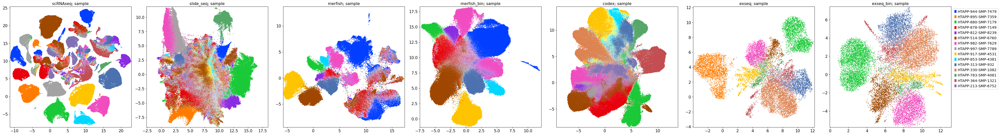

In [19]:
fig = tc.pl.scatter(adatas_combined, keys=['sample'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_sample.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


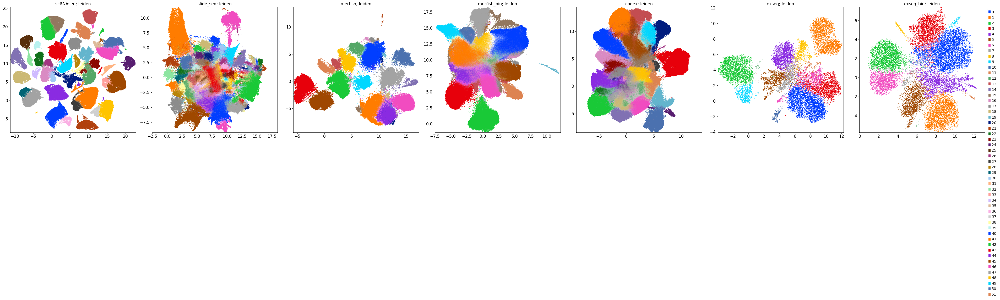

In [21]:
fig = tc.pl.scatter(adatas_combined, keys=['leiden'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_leiden.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


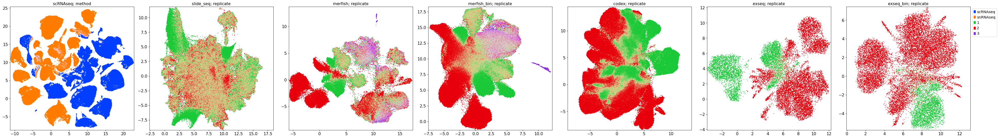

In [20]:
keys=pd.Series([['replicate']]*len(adatas_combined.index), index=adatas_combined.index)
keys['scRNAseq'] = ['method']
fig = tc.pl.scatter(adatas_combined, keys=keys,joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_repl.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


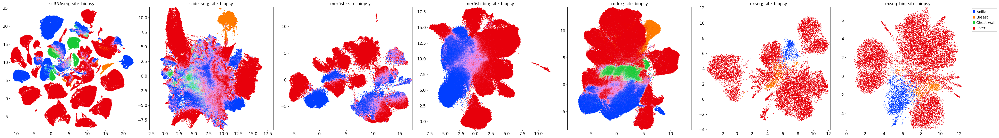

In [22]:
fig = tc.pl.scatter(adatas_combined, keys=['site_biopsy'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_site.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


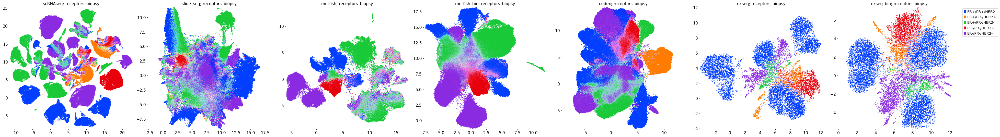

In [23]:
fig = tc.pl.scatter(adatas_combined, keys=['receptors_biopsy'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_receptor.pdf',bbox_inches='tight')

### Quantify cluster cohesion with multiple variables using ARI

In [110]:
variables=['sample','cell_type','site_biopsy','receptors_biopsy']
n_iter=10

In [202]:
ari_res=pd.DataFrame(columns=["n_iter",'method',"subset",'variable','ari'])
for method in all_methods:
    print(method)
    obs=adatas_combined[method].obs
    obs_all=obs
    obs_non_mal=obs[~obs.cell_type.isin(['MBC','MBX_stem-like','MBC_neuronal'])]
    obs_mal=obs[obs.cell_type.isin(['MBC','MBX_stem-like','MBC_neuronal'])]
    for i in range(n_iter):
        for obs,sel in zip([obs_all,obs_non_mal,obs_mal],["all","non_mal","mal"]):
            if method == 'scRNAseq':
                obs_sc=obs[obs.method=="scRNAseq"]
                obs_sn=obs[obs.method=="snRNAseq"]
                to_iter_obj=[obs_sc,obs_sn]
                to_iter_lab=["scRNAseq","snRNAseq"]
            else:
                to_iter_obj=[obs]
                to_iter_lab=[method]

            for obs,method2 in zip(to_iter_obj,to_iter_lab):
                n_obs=obs.shape[0]
                subset=rd.sample(range(n_obs),int(n_obs/10))
                for variable in variables:
                    ari=sk.metrics.adjusted_rand_score(obs.iloc[subset]['leiden'],obs.iloc[subset][variable])
                    ari_res=ari_res.append({"n_iter":i,'method': method2,'subset':sel,'variable':variable,'ari':ari}, ignore_index=True)

scRNAseq
slide_seq
merfish
merfish_bin
codex
exseq
exseq_bin


In [203]:
ari_res

,n_iter,method,subset,variable,ari
0,0,scRNAseq,all,sample,0.475684
1,0,scRNAseq,all,cell_type,0.251220
2,0,scRNAseq,all,site_biopsy,0.023175
3,0,scRNAseq,all,receptors_biopsy,0.350185
4,0,snRNAseq,all,sample,0.390320
...,...,...,...,...,...
955,9,exseq_bin,non_mal,receptors_biopsy,0.378009
956,9,exseq_bin,mal,sample,0.695704
957,9,exseq_bin,mal,cell_type,0.000000
958,9,exseq_bin,mal,site_biopsy,0.130925


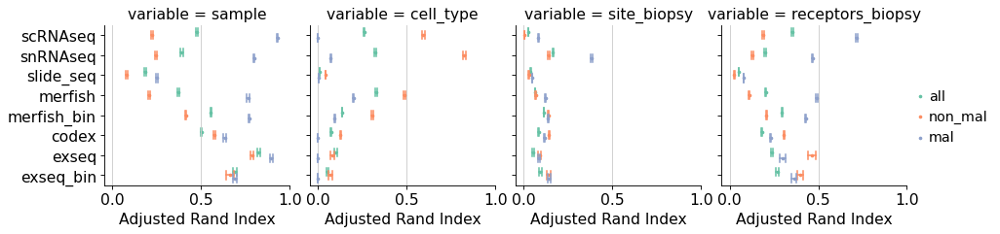

In [223]:
g=sns.FacetGrid(ari_res,col='variable')
g.map_dataframe(sns.pointplot, y="method",x="ari",hue="subset",dodge=0.3,linestyles="none",ci='sd',
                markers=".",scale=0.6,palette="Set2",errwidth=1.4,capsize=0.4)
g.add_legend()
g.set_xlabels("Adjusted Rand Index")
g.set(xlim=(None, 1))
g.savefig(combined_dir+"cluster_congruence_ARI_points.pdf")